In [ ]:
#@title Install pacakges

!pip install rasterio
!pip install geojson
!pip install elapid

#Set up

In [ ]:
#@title Load pacakges
import os
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns

import geopandas as gpd
from shapely.geometry import Point
import geojson
from pprint import pprint
import rasterio
from rasterio.mask import mask
import rasterio.plot as rioplot
import elapid as ela
from sklearn import metrics
from glob import glob
import time

import geemap.core as geemap
from datetime import datetime
import folium
from folium.features import GeoJsonTooltip
from folium.features import DivIcon

from PIL import Image
import io

import pickle
from pathlib import Path

# preferences
%matplotlib inline
mpl.style.use('ggplot')

In [2]:
print(f"Notebook last run with elapid version {ela.__version__}")
print(f"Notebook last run with numpy version {np.__version__}")
print(f"Notebook last run with folium version {folium.__version__}")
print(f"Notebook last run with rasterio version {rasterio.__version__}")

Notebook last run with elapid version 1.0.2
Notebook last run with numpy version 1.26.4
Notebook last run with folium version 0.20.0
Notebook last run with rasterio version 1.4.3


In [ ]:
#@title Set directory

from google.colab import drive
drive.mount('/content/drive/')
print(sorted(os.listdir()))
try:
  os.chdir('/content/.....') #set to your directory path
  print(sorted(os.listdir()))
except:
  print("GGDrive may not have been updated, wait and retry")

Mounted at /content/drive/
['.config', 'drive', 'sample_data']
['Month_of_year.tiff', 'Month_of_yearmain.tiff', 'Week_of_year.tiff', 'Week_of_yearmain.tiff', 'YearMonth.tiff', 'YearMonthmain.tiff', 'Yearmain.tiff', 'all_3bg_spatial_plots.tiff', 'data', 'early_vs_late_plot.tiff', 'maxent_output_nov', 'maxent_output_nov_future', 'maxent_output_nov_future_testuniform', 'notebooks', 'scripts', 'thinned_early_plot.tiff']


In [ ]:
#@title Add system path for scripts

import sys

if '2_scripts' not in sys.path:
    sys.path.append('2_scripts')
print(sys.path)

['/content', '/env/python', '/usr/lib/python312.zip', '/usr/lib/python3.12', '/usr/lib/python3.12/lib-dynload', '', '/usr/local/lib/python3.12/dist-packages', '/usr/lib/python3/dist-packages', '/usr/local/lib/python3.12/dist-packages/IPython/extensions', '/root/.ipython', '/usr/local/lib/python3.12/dist-packages/setuptools/_vendor', 'scripts']


In [5]:
#@title import from scripts

import importlib

import preprocess_fawdata as pf
importlib.reload(pf)
import visualisation_fawdata as vf
importlib.reload(vf)
import preprocess_climatedata as pc
importlib.reload(pc)
import visualisation_climatedata as vc
importlib.reload(vc)
import augment_elapid as ae
importlib.reload(ae)
import visualisation_elapid as ve
importlib.reload(ve)

<module 'visualisation_elapid' from '/content/drive/My Drive/Colab Notebooks/FAW_climate_project/Publication/scripts/visualisation_elapid.py'>

# compare images

Note that not all of 135 maxent model folders were given - only 30 in "4_maxent_output/grid0.5" were given, so some codes below that use will other models may not work.

In [ ]:
n_rows = 3
n_cols = 5
panel_labels = [f"M{row}{col}" for row in range(1, n_rows+1) for col in range(1, n_cols+1)]
panel_labels

sorted
Found 15 .tiff files ending with modelsplit_map .tiff in the selected subdir (if specified)':
thinned3km_bg1uniform_era5land_modelsplit_map.tiff
thinned3km_bg1uniform_era5yearmonthly_modelsplit_map.tiff
thinned3km_bg1uniform_wcbioclim_modelsplit_map.tiff
thinned3km_bg1uniform_wcmonthly_modelsplit_map.tiff
thinned3km_bg1uniform_wcmonthlybg_modelsplit_map.tiff
thinned3km_bg2lai_era5land_modelsplit_map.tiff
thinned3km_bg2lai_era5yearmonthly_modelsplit_map.tiff
thinned3km_bg2lai_wcbioclim_modelsplit_map.tiff
thinned3km_bg2lai_wcmonthly_modelsplit_map.tiff
thinned3km_bg2lai_wcmonthlybg_modelsplit_map.tiff
thinned3km_bg3meanA3yr_era5land_modelsplit_map.tiff
thinned3km_bg3meanA3yr_era5yearmonthly_modelsplit_map.tiff
thinned3km_bg3meanA3yr_wcbioclim_modelsplit_map.tiff
thinned3km_bg3meanA3yr_wcmonthly_modelsplit_map.tiff
thinned3km_bg3meanA3yr_wcmonthlybg_modelsplit_map.tiff


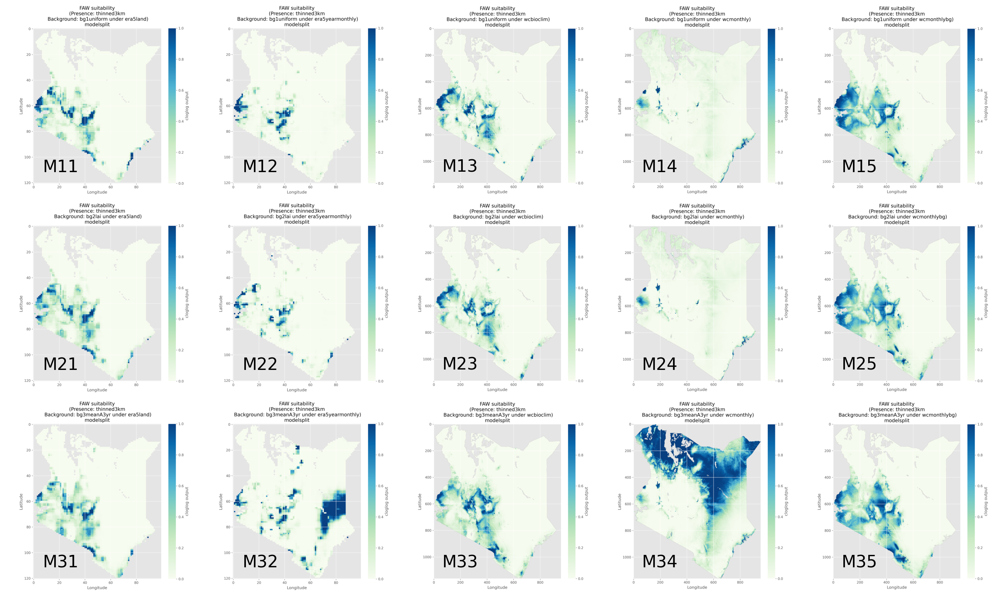

save image with ['thinned3km'] and modelsplit_mapgrid05 name in "maxent_output_nov/list_score_grid030405" folder
sorted
Found 15 .tiff files ending with modelsplit_map .tiff in the selected subdir (if specified)':
thinned5km_bg1uniform_era5land_modelsplit_map.tiff
thinned5km_bg1uniform_era5yearmonthly_modelsplit_map.tiff
thinned5km_bg1uniform_wcbioclim_modelsplit_map.tiff
thinned5km_bg1uniform_wcmonthly_modelsplit_map.tiff
thinned5km_bg1uniform_wcmonthlybg_modelsplit_map.tiff
thinned5km_bg2lai_era5land_modelsplit_map.tiff
thinned5km_bg2lai_era5yearmonthly_modelsplit_map.tiff
thinned5km_bg2lai_wcbioclim_modelsplit_map.tiff
thinned5km_bg2lai_wcmonthly_modelsplit_map.tiff
thinned5km_bg2lai_wcmonthlybg_modelsplit_map.tiff
thinned5km_bg3meanA3yr_era5land_modelsplit_map.tiff
thinned5km_bg3meanA3yr_era5yearmonthly_modelsplit_map.tiff
thinned5km_bg3meanA3yr_wcbioclim_modelsplit_map.tiff
thinned5km_bg3meanA3yr_wcmonthly_modelsplit_map.tiff
thinned5km_bg3meanA3yr_wcmonthlybg_modelsplit_map.tiff


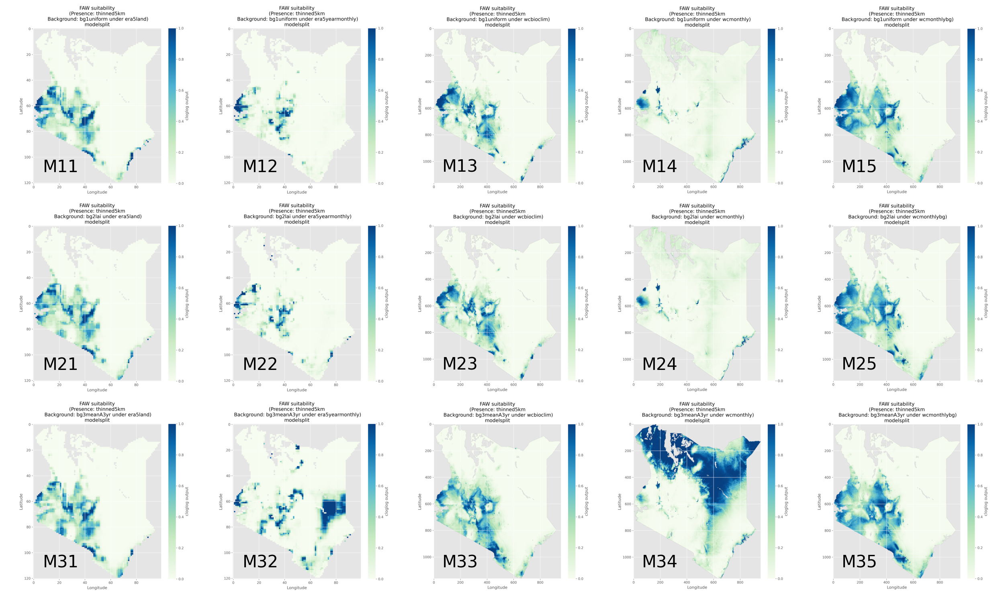

save image with ['thinned5km'] and modelsplit_mapgrid05 name in "maxent_output_nov/list_score_grid030405" folder
sorted
Found 15 .tiff files ending with modelsplit_map .tiff in the selected subdir (if specified)':
thinned9km_bg1uniform_era5land_modelsplit_map.tiff
thinned9km_bg1uniform_era5yearmonthly_modelsplit_map.tiff
thinned9km_bg1uniform_wcbioclim_modelsplit_map.tiff
thinned9km_bg1uniform_wcmonthly_modelsplit_map.tiff
thinned9km_bg1uniform_wcmonthlybg_modelsplit_map.tiff
thinned9km_bg2lai_era5land_modelsplit_map.tiff
thinned9km_bg2lai_era5yearmonthly_modelsplit_map.tiff
thinned9km_bg2lai_wcbioclim_modelsplit_map.tiff
thinned9km_bg2lai_wcmonthly_modelsplit_map.tiff
thinned9km_bg2lai_wcmonthlybg_modelsplit_map.tiff
thinned9km_bg3meanA3yr_era5land_modelsplit_map.tiff
thinned9km_bg3meanA3yr_era5yearmonthly_modelsplit_map.tiff
thinned9km_bg3meanA3yr_wcbioclim_modelsplit_map.tiff
thinned9km_bg3meanA3yr_wcmonthly_modelsplit_map.tiff
thinned9km_bg3meanA3yr_wcmonthlybg_modelsplit_map.tiff


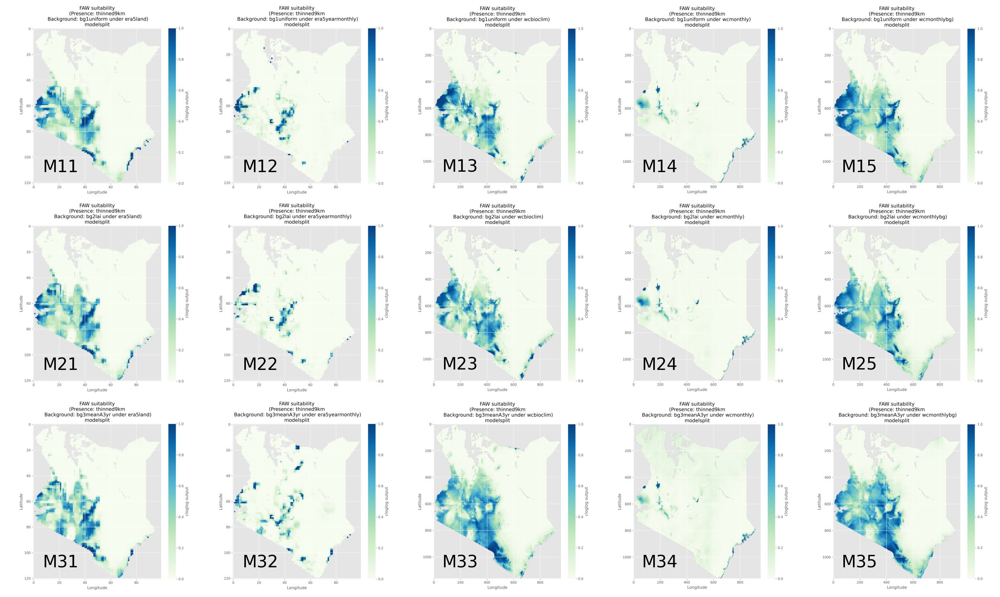

save image with ['thinned9km'] and modelsplit_mapgrid05 name in "maxent_output_nov/list_score_grid030405" folder
sorted
Found 15 .tiff files ending with modelsplit_map .tiff in the selected subdir (if specified)':
thinned3km_bg1uniform_era5land_modelsplit_map.tiff
thinned3km_bg1uniform_era5yearmonthly_modelsplit_map.tiff
thinned3km_bg1uniform_wcbioclim_modelsplit_map.tiff
thinned3km_bg1uniform_wcmonthly_modelsplit_map.tiff
thinned3km_bg1uniform_wcmonthlybg_modelsplit_map.tiff
thinned3km_bg2lai_era5land_modelsplit_map.tiff
thinned3km_bg2lai_era5yearmonthly_modelsplit_map.tiff
thinned3km_bg2lai_wcbioclim_modelsplit_map.tiff
thinned3km_bg2lai_wcmonthly_modelsplit_map.tiff
thinned3km_bg2lai_wcmonthlybg_modelsplit_map.tiff
thinned3km_bg3meanA3yr_era5land_modelsplit_map.tiff
thinned3km_bg3meanA3yr_era5yearmonthly_modelsplit_map.tiff
thinned3km_bg3meanA3yr_wcbioclim_modelsplit_map.tiff
thinned3km_bg3meanA3yr_wcmonthly_modelsplit_map.tiff
thinned3km_bg3meanA3yr_wcmonthlybg_modelsplit_map.tiff


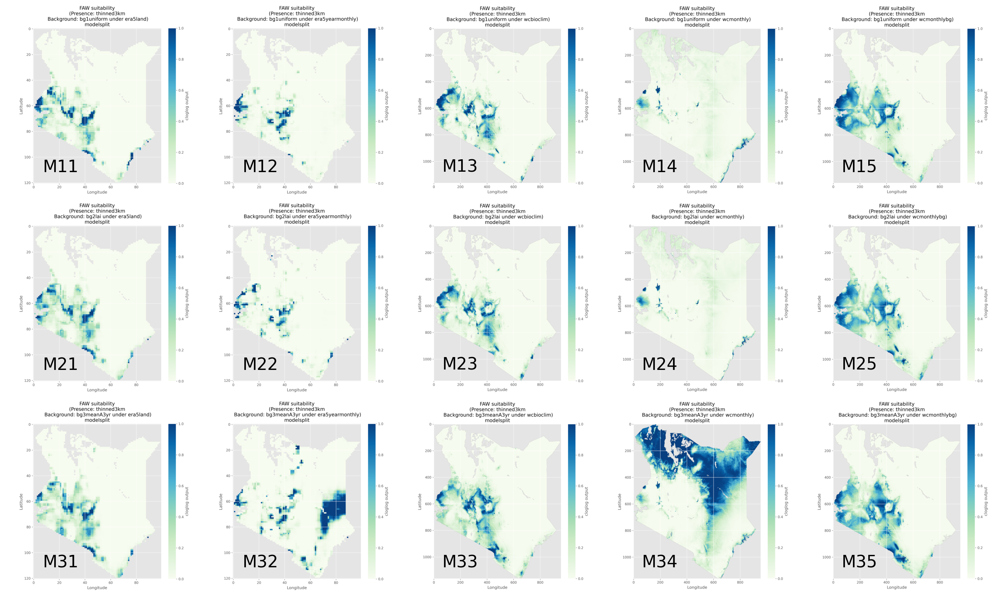

save image with ['thinned3km'] and modelsplit_mapgrid04 name in "maxent_output_nov/list_score_grid030405" folder
sorted
Found 15 .tiff files ending with modelsplit_map .tiff in the selected subdir (if specified)':
thinned5km_bg1uniform_era5land_modelsplit_map.tiff
thinned5km_bg1uniform_era5yearmonthly_modelsplit_map.tiff
thinned5km_bg1uniform_wcbioclim_modelsplit_map.tiff
thinned5km_bg1uniform_wcmonthly_modelsplit_map.tiff
thinned5km_bg1uniform_wcmonthlybg_modelsplit_map.tiff
thinned5km_bg2lai_era5land_modelsplit_map.tiff
thinned5km_bg2lai_era5yearmonthly_modelsplit_map.tiff
thinned5km_bg2lai_wcbioclim_modelsplit_map.tiff
thinned5km_bg2lai_wcmonthly_modelsplit_map.tiff
thinned5km_bg2lai_wcmonthlybg_modelsplit_map.tiff
thinned5km_bg3meanA3yr_era5land_modelsplit_map.tiff
thinned5km_bg3meanA3yr_era5yearmonthly_modelsplit_map.tiff
thinned5km_bg3meanA3yr_wcbioclim_modelsplit_map.tiff
thinned5km_bg3meanA3yr_wcmonthly_modelsplit_map.tiff
thinned5km_bg3meanA3yr_wcmonthlybg_modelsplit_map.tiff


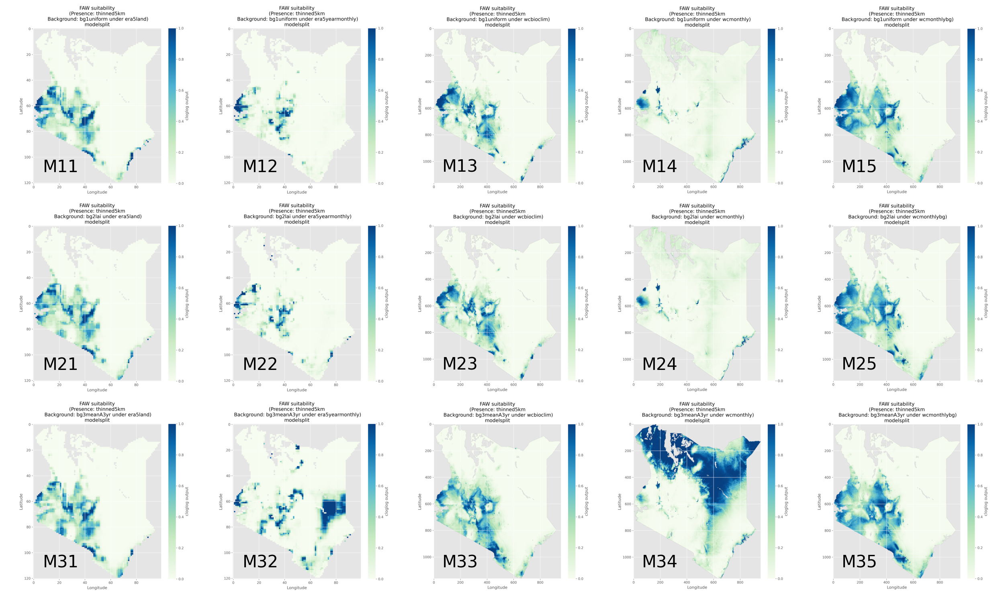

save image with ['thinned5km'] and modelsplit_mapgrid04 name in "maxent_output_nov/list_score_grid030405" folder
sorted
Found 15 .tiff files ending with modelsplit_map .tiff in the selected subdir (if specified)':
thinned9km_bg1uniform_era5land_modelsplit_map.tiff
thinned9km_bg1uniform_era5yearmonthly_modelsplit_map.tiff
thinned9km_bg1uniform_wcbioclim_modelsplit_map.tiff
thinned9km_bg1uniform_wcmonthly_modelsplit_map.tiff
thinned9km_bg1uniform_wcmonthlybg_modelsplit_map.tiff
thinned9km_bg2lai_era5land_modelsplit_map.tiff
thinned9km_bg2lai_era5yearmonthly_modelsplit_map.tiff
thinned9km_bg2lai_wcbioclim_modelsplit_map.tiff
thinned9km_bg2lai_wcmonthly_modelsplit_map.tiff
thinned9km_bg2lai_wcmonthlybg_modelsplit_map.tiff
thinned9km_bg3meanA3yr_era5land_modelsplit_map.tiff
thinned9km_bg3meanA3yr_era5yearmonthly_modelsplit_map.tiff
thinned9km_bg3meanA3yr_wcbioclim_modelsplit_map.tiff
thinned9km_bg3meanA3yr_wcmonthly_modelsplit_map.tiff
thinned9km_bg3meanA3yr_wcmonthlybg_modelsplit_map.tiff


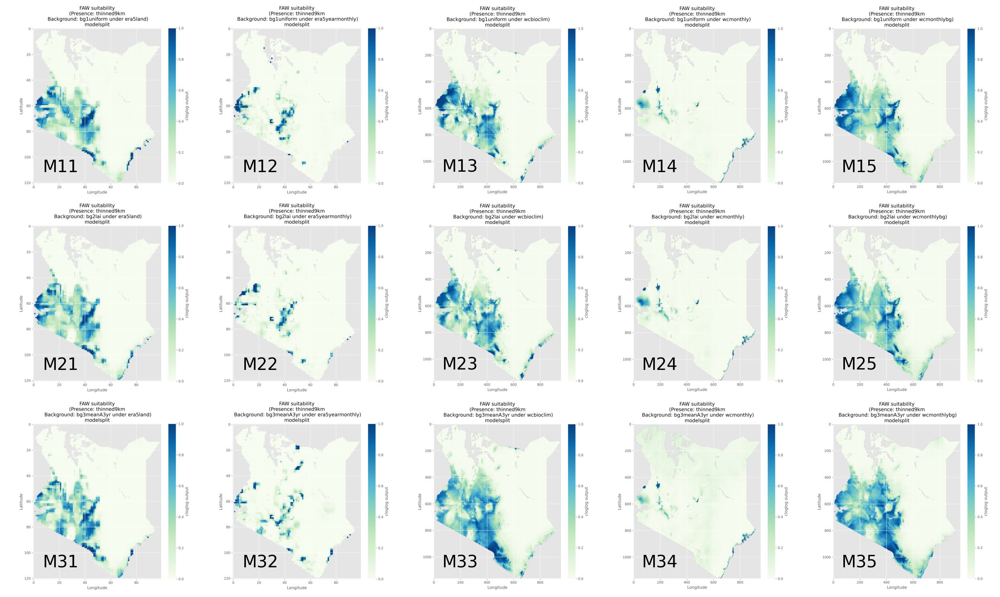

save image with ['thinned9km'] and modelsplit_mapgrid04 name in "maxent_output_nov/list_score_grid030405" folder
sorted
Found 15 .tiff files ending with modelsplit_map .tiff in the selected subdir (if specified)':
thinned3km_bg1uniform_era5land_modelsplit_map.tiff
thinned3km_bg1uniform_era5yearmonthly_modelsplit_map.tiff
thinned3km_bg1uniform_wcbioclim_modelsplit_map.tiff
thinned3km_bg1uniform_wcmonthly_modelsplit_map.tiff
thinned3km_bg1uniform_wcmonthlybg_modelsplit_map.tiff
thinned3km_bg2lai_era5land_modelsplit_map.tiff
thinned3km_bg2lai_era5yearmonthly_modelsplit_map.tiff
thinned3km_bg2lai_wcbioclim_modelsplit_map.tiff
thinned3km_bg2lai_wcmonthly_modelsplit_map.tiff
thinned3km_bg2lai_wcmonthlybg_modelsplit_map.tiff
thinned3km_bg3meanA3yr_era5land_modelsplit_map.tiff
thinned3km_bg3meanA3yr_era5yearmonthly_modelsplit_map.tiff
thinned3km_bg3meanA3yr_wcbioclim_modelsplit_map.tiff
thinned3km_bg3meanA3yr_wcmonthly_modelsplit_map.tiff
thinned3km_bg3meanA3yr_wcmonthlybg_modelsplit_map.tiff


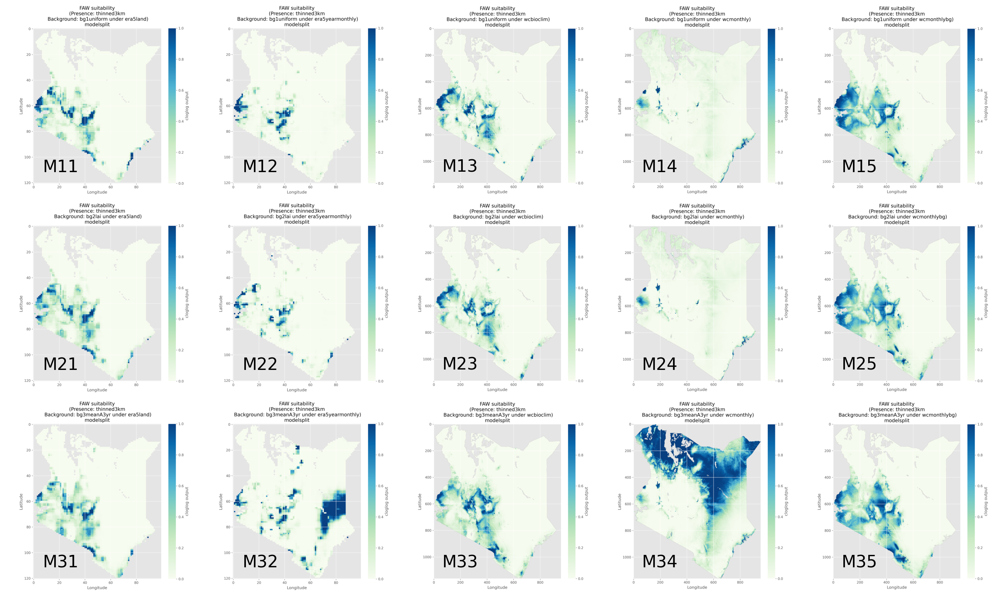

save image with ['thinned3km'] and modelsplit_mapgrid03 name in "maxent_output_nov/list_score_grid030405" folder
sorted
Found 15 .tiff files ending with modelsplit_map .tiff in the selected subdir (if specified)':
thinned5km_bg1uniform_era5land_modelsplit_map.tiff
thinned5km_bg1uniform_era5yearmonthly_modelsplit_map.tiff
thinned5km_bg1uniform_wcbioclim_modelsplit_map.tiff
thinned5km_bg1uniform_wcmonthly_modelsplit_map.tiff
thinned5km_bg1uniform_wcmonthlybg_modelsplit_map.tiff
thinned5km_bg2lai_era5land_modelsplit_map.tiff
thinned5km_bg2lai_era5yearmonthly_modelsplit_map.tiff
thinned5km_bg2lai_wcbioclim_modelsplit_map.tiff
thinned5km_bg2lai_wcmonthly_modelsplit_map.tiff
thinned5km_bg2lai_wcmonthlybg_modelsplit_map.tiff
thinned5km_bg3meanA3yr_era5land_modelsplit_map.tiff
thinned5km_bg3meanA3yr_era5yearmonthly_modelsplit_map.tiff
thinned5km_bg3meanA3yr_wcbioclim_modelsplit_map.tiff
thinned5km_bg3meanA3yr_wcmonthly_modelsplit_map.tiff
thinned5km_bg3meanA3yr_wcmonthlybg_modelsplit_map.tiff


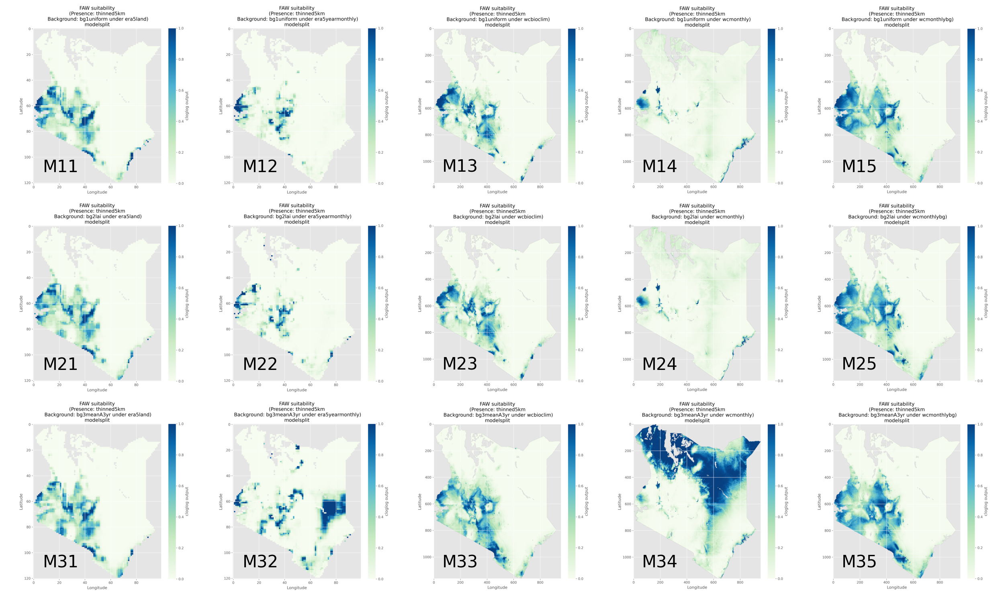

save image with ['thinned5km'] and modelsplit_mapgrid03 name in "maxent_output_nov/list_score_grid030405" folder
sorted
Found 15 .tiff files ending with modelsplit_map .tiff in the selected subdir (if specified)':
thinned9km_bg1uniform_era5land_modelsplit_map.tiff
thinned9km_bg1uniform_era5yearmonthly_modelsplit_map.tiff
thinned9km_bg1uniform_wcbioclim_modelsplit_map.tiff
thinned9km_bg1uniform_wcmonthly_modelsplit_map.tiff
thinned9km_bg1uniform_wcmonthlybg_modelsplit_map.tiff
thinned9km_bg2lai_era5land_modelsplit_map.tiff
thinned9km_bg2lai_era5yearmonthly_modelsplit_map.tiff
thinned9km_bg2lai_wcbioclim_modelsplit_map.tiff
thinned9km_bg2lai_wcmonthly_modelsplit_map.tiff
thinned9km_bg2lai_wcmonthlybg_modelsplit_map.tiff
thinned9km_bg3meanA3yr_era5land_modelsplit_map.tiff
thinned9km_bg3meanA3yr_era5yearmonthly_modelsplit_map.tiff
thinned9km_bg3meanA3yr_wcbioclim_modelsplit_map.tiff
thinned9km_bg3meanA3yr_wcmonthly_modelsplit_map.tiff
thinned9km_bg3meanA3yr_wcmonthlybg_modelsplit_map.tiff


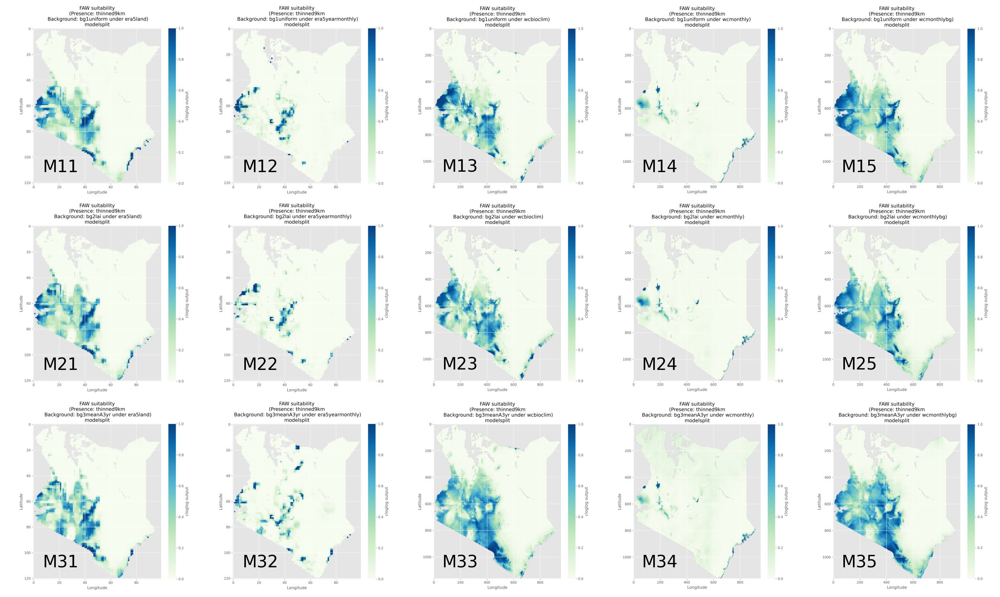

save image with ['thinned9km'] and modelsplit_mapgrid03 name in "maxent_output_nov/list_score_grid030405" folder


In [ ]:
keyword = 'modelsplit_map'
addname_bf = ['grid05', 'grid04','grid03']
for i,bf in enumerate(['4_maxent_output/grid0.5','4_maxent_output/grid0.4','4_maxent_output/grid0.3']):
  for thindist in ['thinned3km','thinned5km','thinned9km']:
    ve.compare_image_output(bf, keyword, n_cols , saveplot = True, savefolder = 'maxent_output_nov/list_score_grid030405',
                     addname = addname_bf[i],subdir_select = [thindist], namefile_select = None, sortlength = False)

# plot heatmap of correlation and quantiles of map
Note that not all of 135 maxent model folders were given - only 30 in "4_maxent_output/grid0.5" were given, so some codes below that use will other models may not work.

In [ ]:
#@title correlation of map pixels
import seaborn as sns


quantiles_list = []
for keyword in ['era5land','era5yearmonthly', 'wcbioclim','wcmonthly_','wcmonthlybg',]:
# for keyword in ['bg1uniform','bg2lai','bg3meanA3yr']:
    root = Path("4_maxent_output")
    grid_folders = [root/"grid0.3", root/"grid0.4", root/"grid0.5"]
    index_map = {}
    for grid_folder in grid_folders:
      grid_folder_name = grid_folder.name
      grid_folder_name = grid_folder_name
      for subfolder in grid_folder.iterdir():
        subfolder_name = subfolder.name
        subfolder_name = subfolder_name.replace('ModelOut_','')
        for tif_bg in subfolder.glob(f"*{keyword}*.tif"):
          # print(tif_bg)
          key = subfolder_name.replace(f'_{keyword.replace('_','')}','')  # location name (loc01, loc02, ...)
          # print(key)
          index_map.setdefault(key, {})[grid_folder_name] = tif_bg
          # ve.check_raster_properties(tif)
          # era5land = 6966/12100 (57.57%) # era5yearmonthly = 6966/12100
          # wcbioclim = 656635/1115112 (58.89%)
          # wcmonthly = 656721/1110872 (59.12%) # wcmonthlybg = 656721/1110872
    # index_map

    correlation_results = []

    # dictionary to store df for each raster
    raster_data = {}   # name → pandas Series or 1D array

    arrays = {}

    for combination, files in index_map.items():
        # print(combination)
        # print(files)
        for grid, path in files.items():
            # print(grid)
            # print(path)
            name = f"{combination}_{grid}"
            # print("Loading:", name, "→", path)
            vec = ve.read_raster_as_vector(path)
            raster_data[name] = vec  # keep if needed globally
            # print(' => -9999 pixels:',sum(vec == -9999))
            # print(' => non -9999 pixels:',sum(vec != -9999))
            vec = vec[vec != -9999] #remove pixels with -9999
            arrays[name] = vec
        # print(arrays)


    if len(arrays) >= 2:
        # Convert to DataFrame (columns = rasters)
        df = pd.DataFrame(arrays)
        # Compute correlation matrix (pixel-wise)
        corr = df.corr()

        vals = corr.values.flatten()
        vals = vals[~np.isnan(vals)]
        vals = vals[vals != 1.0]
        # compute quantiles
        quantiles = np.quantile(vals, np.arange(0, 1.01, 0.1))
        print(keyword)
        print('=>',quantiles)
        quantiles_list.append(quantiles)


    # plot heatmap (lower triagle only)
    mask = np.triu(np.ones_like(corr, dtype=bool), k=1)
    plt.figure(figsize=(11, 10))   # tall figure for 45 rows
    sns.heatmap(corr,mask = mask, annot=False,
        cmap="RdBu",vmin=0,vmax=1,linewidths=0.3)
    plt.title(f"Pixel-wise Pearson Correlation - {keyword.replace('_','')}")
    plt.tight_layout()
    plt.savefig(f'4_maxent_output/list_score_grid030405/corr_{keyword}_cleanednames.tiff', dpi = 300)
    plt.show()




era5land
=> [0.52154694 0.64039134 0.69515912 0.74209093 0.78174797 0.80748519
 0.84545218 0.87300767 0.90162766 0.93747274 0.97549599]
era5yearmonthly
=> [0.13599549 0.30180888 0.36255466 0.41043766 0.48705777 0.61809433
 0.6906161  0.72682197 0.76355525 0.80432578 0.94526662]
wcbioclim
=> [0.60173071 0.71780068 0.75738978 0.78030792 0.80027606 0.81933487
 0.8413748  0.86630625 0.8866397  0.91709854 0.9805083 ]
wcmonthly_
=> [-0.04801421  0.01329324  0.24358613  0.65777187  0.73550097  0.77831395
  0.81986455  0.85165671  0.88663271  0.92137543  0.99742889]
wcmonthlybg
=> [0.65727059 0.8187941  0.85445204 0.87501522 0.89340831 0.90684864
 0.92632533 0.94062094 0.95655831 0.97099782 0.99087879]


In [ ]:
quantiles_list
# convert each numpy array in quantiles_list to a pandas Series before concatenating
# quantiles_df1 = pd.concat([pd.Series(q) for q in quantiles_list], axis = 1)
# quantiles_df1.to_csv('4_maxent_output/list_score_grid030405/quantiles_df1.csv')

quantiles_df = pd.concat([pd.Series(q) for q in quantiles_list], axis = 1)
quantiles_df.columns = ['era5land','era5yearmonthly', 'wcbioclim','wcmonthly','wcmonthlybg']
quantiles_df.to_csv('4_maxent_output/stats/TableA1.csv')
quantiles_df

,0,1,2,3,4
0,0.521547,0.135995,0.601731,-0.048014,0.657271
1,0.640391,0.301809,0.717801,0.013293,0.818794
2,0.695159,0.362555,0.757390,0.243586,0.854452
3,0.742091,0.410438,0.780308,0.657772,0.875015
4,0.781748,0.487058,0.800276,0.735501,0.893408
5,0.807485,0.618094,0.819335,0.778314,0.906849
6,0.845452,0.690616,0.841375,0.819865,0.926325
7,0.873008,0.726822,0.866306,0.851657,0.940621
8,0.901628,0.763555,0.886640,0.886633,0.956558
9,0.937473,0.804326,0.917099,0.921375,0.970998


# count pixels in each categories of best model prediction
First, import aggregated_M222325_rastertopolygon from QGIS
WE used QGIS to average model piredictions form M22, M23, M25 because QGIS can internally handle raster with different resolution

In [ ]:
#@title Read the CSV file raster
df = pd.read_csv('4_maxent_output/bestmodels/aggregated_M222325_rastertopolygon.csv')
df = pd.DataFrame(df)
df.columns
# Define the bins
bins = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
labels = ['0.0-0.2', '0.2-0.4', '0.4-0.6', '0.6-0.8', '0.8-1.0']

# Count values in each range
counts = pd.cut(df['VALUE'], bins=bins, labels=labels, include_lowest=True).value_counts().sort_index()
sum(counts) #6746
print(counts)
counts_df = pd.DataFrame(counts)
counts_df
counts_df['percent'] = counts_df['count']/sum(counts)
counts_df

# compare predictions (proba1 vs ytrue)

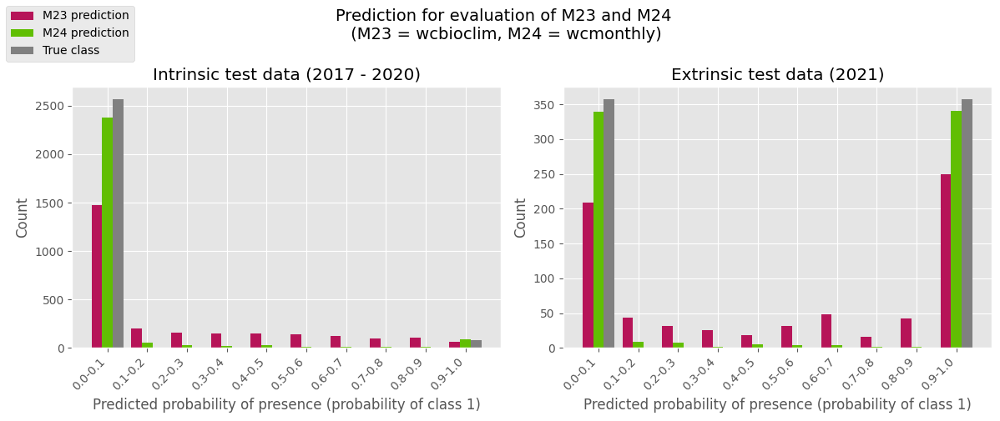

In [ ]:
#@title compare prediction
m23inteval = pd.read_csv('4_maxent_output/grid0.5/ModelOut_thinned9km_bg2lai_wcbioclim/int2017_20_eval.csv')[['class',	'proba0',	'proba1']]
m24inteval = pd.read_csv('4_maxent_output/grid0.5/ModelOut_thinned9km_bg2lai_wcmonthly/int2017_20_eval.csv')[['class',	'proba0',	'proba1']]
m23exteval = pd.read_csv('4_maxent_output/grid0.5/ModelOut_thinned9km_bg2lai_wcbioclim/ext2021_eval.csv')[['class',	'proba1']]
m24exteval = pd.read_csv('4_maxent_output/grid0.5/ModelOut_thinned9km_bg2lai_wcmonthly/ext2021_eval.csv')[['class',	'proba1']]
# sum(m23inteval['class'] != m24inteval['class'])
# sum(m23exteval['class'] != m24exteval['class'])
ncols = 2
nrows = 1
bins = np.arange(0, 1.0001, 0.1)
bin_labels = [f"{bins[i]:.1f}-{bins[i+1]:.1f}" for i in range(len(bins)-1)]

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6*ncols, 5*nrows))
pair_colors = pair_colors = ['#b61458', '#61be03']


vals = [m23inteval['proba1'], m24inteval['proba1'], m23inteval['class'] ]
counts, bin_edges, patches = axs[0].hist(
    vals,
    bins=bins,
    # edgecolor='black',
    align='left',   # remove the gap between bars
    linewidth=1,
    label=['M23 prediction', 'M24 prediction', 'True class'],
    color=pair_colors + ['grey']
)
# Label bins as ranges
axs[0].set_xticks(bins[:-1])
axs[0].set_xticklabels(bin_labels, rotation=45, ha='right')
axs[0].set_title('Intrinsic test data (2017 - 2020)')
axs[0].set_xlabel('Predicted probability of presence (probability of class 1)')
axs[0].set_ylabel('Count')

vals = [m23exteval['proba1'], m24exteval['proba1'], m23exteval['class']]
counts, bin_edges, patches = axs[1].hist(
    vals,
    bins=bins,
    # edgecolor='black',
    align='left',   # remove the gap between bars
    linewidth=1,
    label=['M23 prediction', 'M24 prediction', 'True class'],
    color=pair_colors + ['grey']
)
# Label bins as ranges
axs[1].set_xticks(bins[:-1])
axs[1].set_xticklabels(bin_labels, rotation=45, ha='right')
axs[1].set_xlabel('Predicted probability of presence (probability of class 1)')
axs[1].set_ylabel('Count')
axs[1].set_title('Extrinsic test data (2021)')
handles, lbls = axs[1].get_legend_handles_labels()
fig.legend(handles, lbls, loc='upper left', ncol=1)
fig.suptitle(f'Prediction for evaluation of M23 and M24\n (M23 = wcbioclim, M24 = wcmonthly)', fontsize=14, y=1)
fig.tight_layout()
fig.savefig('maxent_output_nov/M23M24comparedprediction.tiff', dpi = 300, bbox_inches = "tight")
fig.show()

# compare performance score

In [ ]:
# auc_checker_auc_ext
base_dir = '4_maxent_output/grid0.3'
keyword = 'auc_checker_auc_ext'
# keyword = 'era5yearmonthly'
replaced_foldername = 'ModelOut_'
csv_file = sorted(glob(os.path.join(base_dir, f'**/*{keyword}*.csv'), recursive=True))
csv_file

list_score = []
for path in csv_file:
  score = pd.read_csv(path).drop(columns="Unnamed: 0")
  score['condition'] = path.split('/')[2].replace(replaced_foldername, '')
  split_cols = score['condition'].str.split('_', expand=True)
  split_cols.columns = ['thindist', 'background', 'climate']
  score = pd.concat([split_cols,score], axis=1)
  # display(score)
  list_score.append(score)

list_score_grid03 = pd.concat(list_score, axis = 0)
list_score_grid03

,thindist,background,climate,sensitivity,specificity,auc_checker,auc_ext,condition
0,thinned3km,bg1uniform,era5land,0.467213,0.941273,0.913222,0.893071,thinned3km_bg1uniform_era5land
0,thinned3km,bg1uniform,era5yearmonthly,0.770492,0.970431,0.955253,0.914586,thinned3km_bg1uniform_era5yearmonthly
0,thinned3km,bg1uniform,wcbioclim,0.573770,0.958098,0.934799,0.923240,thinned3km_bg1uniform_wcbioclim
0,thinned3km,bg1uniform,wcmonthly,1.000000,0.970173,0.999395,0.999466,thinned3km_bg1uniform_wcmonthly
0,thinned3km,bg1uniform,wcmonthlybg,0.737705,0.919387,0.932371,0.862698,thinned3km_bg1uniform_wcmonthlybg
0,thinned3km,bg2lai,era5land,0.496000,0.912907,0.885290,0.833565,thinned3km_bg2lai_era5land
0,thinned3km,bg2lai,era5yearmonthly,0.760000,0.975677,0.928188,0.877733,thinned3km_bg2lai_era5yearmonthly
0,thinned3km,bg2lai,wcbioclim,0.624000,0.939168,0.915068,0.929117,thinned3km_bg2lai_wcbioclim
0,thinned3km,bg2lai,wcmonthly,1.000000,0.976845,1.000000,0.999262,thinned3km_bg2lai_wcmonthly
0,thinned3km,bg2lai,wcmonthlybg,0.744000,0.839089,0.892860,0.864699,thinned3km_bg2lai_wcmonthlybg


In [ ]:
# auc_checker_auc_ext
base_dir = '4_maxent_output/grid0.4'
keyword = 'auc_checker_auc_ext'
# keyword = 'era5yearmonthly'
replaced_foldername = 'ModelOut_'
csv_file = sorted(glob(os.path.join(base_dir, f'**/*{keyword}*.csv'), recursive=True))
csv_file
list_score = []
for path in csv_file:
  score = pd.read_csv(path).drop(columns="Unnamed: 0")
  score['condition'] = path.split('/')[2].replace(replaced_foldername, '')
  split_cols = score['condition'].str.split('_', expand=True)
  split_cols.columns = ['thindist', 'background', 'climate']
  score = pd.concat([split_cols,score], axis=1)
  # display(score)
  list_score.append(score)

list_score_grid04 = pd.concat(list_score, axis = 0)
list_score_grid04

,thindist,background,climate,sensitivity,specificity,auc_checker,auc_ext,condition
0,thinned3km,bg1uniform,era5land,0.475524,0.974887,0.925189,0.906052,thinned3km_bg1uniform_era5land
0,thinned3km,bg1uniform,era5yearmonthly,0.846154,0.967888,0.966192,0.970597,thinned3km_bg1uniform_era5yearmonthly
0,thinned3km,bg1uniform,wcbioclim,0.531469,0.953865,0.915055,0.967273,thinned3km_bg1uniform_wcbioclim
0,thinned3km,bg1uniform,wcmonthly,0.986014,0.981789,0.996915,0.997748,thinned3km_bg1uniform_wcmonthly
0,thinned3km,bg1uniform,wcmonthlybg,0.566434,0.940510,0.912602,0.907398,thinned3km_bg1uniform_wcmonthlybg
0,thinned3km,bg2lai,era5land,0.423358,0.941837,0.878398,0.872164,thinned3km_bg2lai_era5land
0,thinned3km,bg2lai,era5yearmonthly,0.854015,0.963899,0.966271,0.860065,thinned3km_bg2lai_era5yearmonthly
0,thinned3km,bg2lai,wcbioclim,0.554745,0.934887,0.894712,0.936594,thinned3km_bg2lai_wcbioclim
0,thinned3km,bg2lai,wcmonthly,0.985401,0.982717,0.994969,0.992844,thinned3km_bg2lai_wcmonthly
0,thinned3km,bg2lai,wcmonthlybg,0.613139,0.878617,0.875138,0.887673,thinned3km_bg2lai_wcmonthlybg


In [ ]:
# auc_checker_auc_ext
base_dir = '4_maxent_output/grid0.5'
keyword = 'auc_checker_auc_ext'
replaced_foldername = 'ModelOut_'
csv_file = sorted(glob(os.path.join(base_dir, f'**/*{keyword}*.csv'), recursive=True))
csv_file
list_score = []
for path in csv_file:
  score = pd.read_csv(path).drop(columns="Unnamed: 0")
  score['condition'] = path.split('/')[2].replace(replaced_foldername, '')
  split_cols = score['condition'].str.split('_', expand=True)
  split_cols.columns = ['thindist', 'background', 'climate']
  score = pd.concat([split_cols,score], axis=1)
  # display(score)
  list_score.append(score)

list_score_grid05 = pd.concat(list_score, axis = 0)
len(list_score_grid05)

45

In [ ]:
list_score_grid05['gridsize'] = 0.5
list_score_grid04['gridsize'] = 0.4
list_score_grid03['gridsize'] = 0.3
list_score_grid030405 = pd.concat([list_score_grid03,list_score_grid04,list_score_grid05], axis = 0)
list_score_grid030405.info()
list_score_grid030405.to_csv('4_maxent_output/stats/list_score_grid030405.csv')

<class 'pandas.core.frame.DataFrame'>
Index: 90 entries, 0 to 0
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   thindist     90 non-null     object 
 1   background   90 non-null     object 
 2   climate      90 non-null     object 
 3   sensitivity  90 non-null     float64
 4   specificity  90 non-null     float64
 5   auc_checker  90 non-null     float64
 6   auc_ext      90 non-null     float64
 7   condition    90 non-null     object 
 8   gridsize     90 non-null     float64
dtypes: float64(5), object(4)
memory usage: 7.0+ KB
<class 'pandas.core.frame.DataFrame'>
Index: 135 entries, 0 to 0
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   thindist     135 non-null    object 
 1   background   135 non-null    object 
 2   climate      135 non-null    object 
 3   sensitivity  135 non-null    float64
 4   specificity  135 non-null    float64

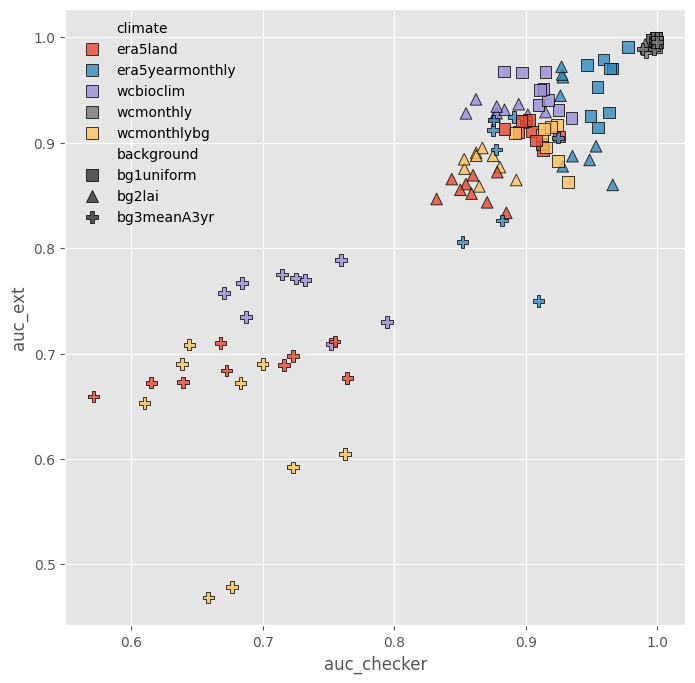

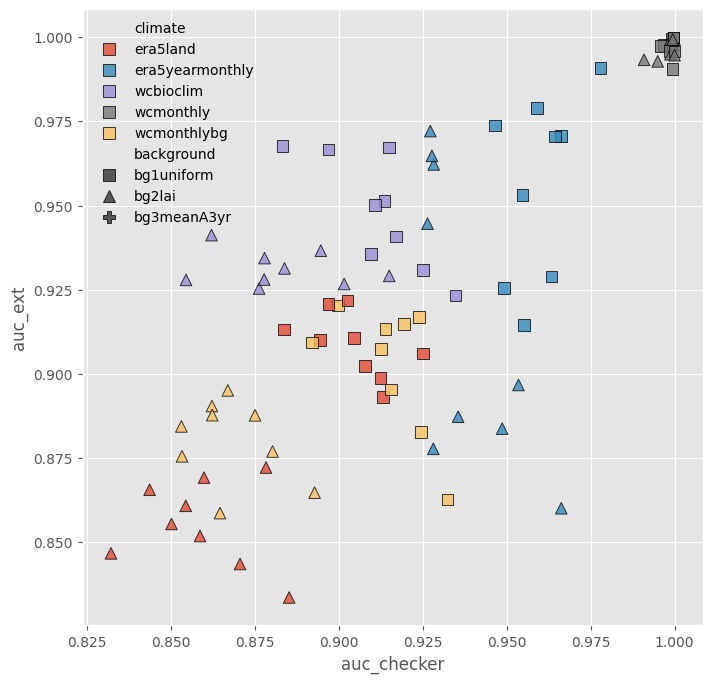

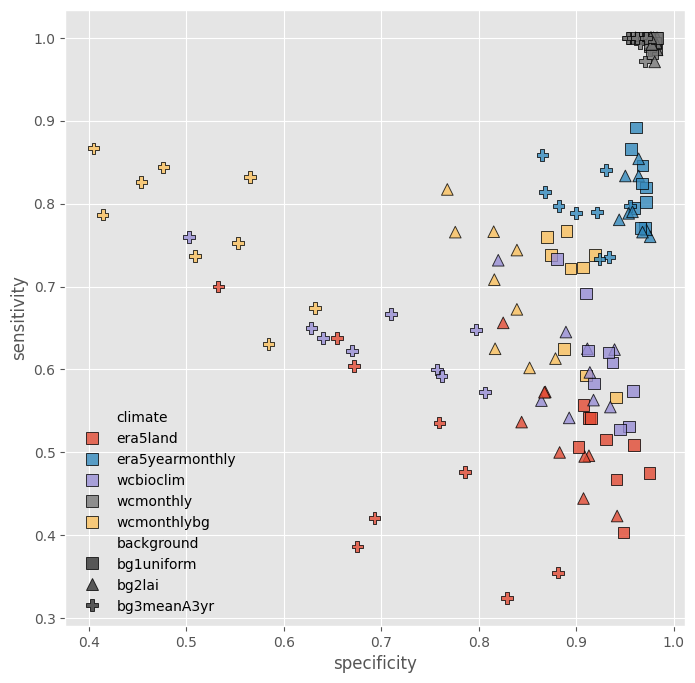

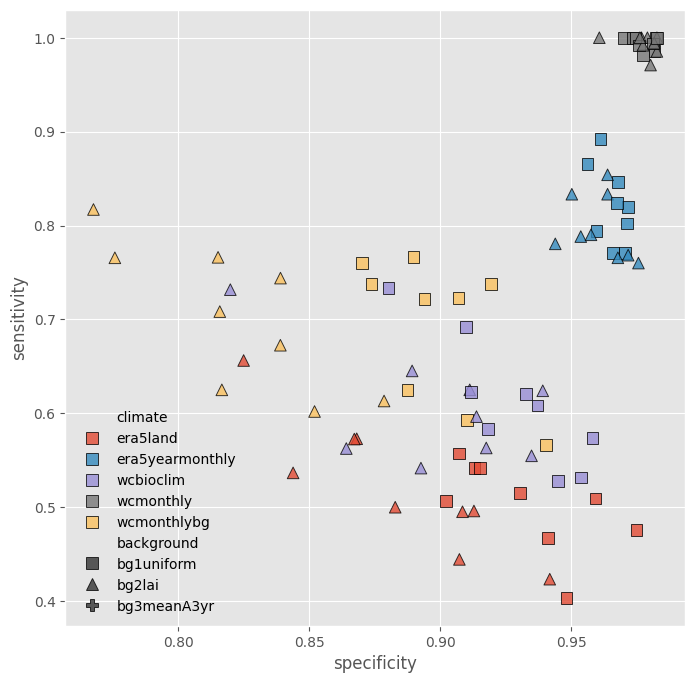

In [ ]:
background_order = ['bg1uniform', 'bg2lai', 'bg3meanA3yr']
marker_seq = ['s', '^', 'P']
marker_map = dict(zip(background_order, marker_seq))

fig, axes = plt.subplots(1, 1, figsize=(8, 8))

sns.scatterplot(ax=axes,
    data=list_score_grid030405,
    x="auc_checker",
    y="auc_ext",
    hue="climate",          # color by climate
    style="background",     # marker shape by background
    s=70,                   # marker size
    alpha=0.8,
    edgecolor="black",
    markers = marker_map,
    style_order=background_order
)
axes.legend_.get_frame().set_visible(False)
fig.savefig('maxent_output_nov/list_score_grid030405/all_auc_checker_auc_ext.tiff', dpi = 300)
fig, axes = plt.subplots(1, 1, figsize=(8, 8))

sns.scatterplot(ax=axes,
    data=list_score_grid030405[list_score_grid030405['background'] != 'bg3meanA3yr'],
    x="auc_checker",
    y="auc_ext",
    hue="climate",          # color by climate
    style="background",     # marker shape by background
    s=70,                   # marker size
    alpha=0.8,
    edgecolor="black",
    markers = marker_map,
    style_order=background_order
)
axes.legend_.get_frame().set_visible(False)
fig.savefig('maxent_output_nov/list_score_grid030405/bg1bg2all_auc_checker_auc_ext.tiff', dpi = 300)


fig, axes = plt.subplots(1, 1, figsize=(8, 8))

sns.scatterplot(ax=axes,
    data=list_score_grid030405,
    x="specificity",
    y="sensitivity",
    hue="climate",          # color by climate
    style="background",     # marker shape by background
    s=70,                   # marker size
    alpha=0.8,
    edgecolor="black",
    markers = marker_map,
    style_order=background_order
)
axes.legend_.get_frame().set_visible(False)
fig.savefig('maxent_output_nov/list_score_grid030405/all_specificity_sensitivity.tiff', dpi = 300)

fig, axes = plt.subplots(1, 1, figsize=(8, 8))

sns.scatterplot(ax=axes,
    data=list_score_grid030405[list_score_grid030405['background'] != 'bg3meanA3yr'],
    x="specificity",
    y="sensitivity",
    hue="climate",          # color by climate
    style="background",     # marker shape by background
    s=70,                   # marker size
    alpha=0.8,
    edgecolor="black",
    markers = marker_map,
    style_order=background_order
)
axes.legend_.get_frame().set_visible(False)
fig.savefig('maxent_output_nov/list_score_grid030405/bg1bg2_specificity_sensitivity.tiff', dpi = 300)




In [53]:
groupscore = list_score_grid030405.drop(columns=['condition','gridsize','thindist']).groupby(['background', 'climate']).agg(["mean", "std"])
groupscore

groupscore.columns = [
    f"{col}_{stat}" for col, stat in groupscore.columns
]
groupscore

sensitivity_mean  sensitivity_std  \
background  climate                                              
bg1uniform  era5land                 0.502050         0.047513   
            era5yearmonthly          0.820526         0.041566   
            wcbioclim                0.610337         0.068110   
            wcmonthly                0.994793         0.007073   
            wcmonthlybg              0.692294         0.076115   
bg2lai      era5land                 0.521920         0.071600   
            era5yearmonthly          0.797064         0.034383   
            wcbioclim                0.604931         0.059790   
            wcmonthly                0.993596         0.009947   
            wcmonthlybg              0.701528         0.077388   
bg3meanA3yr era5land                 0.493519         0.133254   
            era5yearmonthly          0.794973         0.041578   
            wcbioclim                0.638886         0.054768   
            wcmonthly                0.994507         0.009971   
            wcmonthlybg              0.772098         0.080695   

                             specificity_mean  specificity_std  \
background  climate                                              
bg1uniform  era5land                 0.932464         0.025156   
            era5yearmonthly          0.965727         0.005516   
            wcbioclim                0.927461         0.024804   
            wcmonthly                0.977694         0.004534   
            wcmonthlybg              0.899147         0.022459   
bg2lai      era5land                 0.884211         0.036988   
            era5yearmonthly          0.960946         0.010404   
            wcbioclim                0.898112         0.037426   
            wcmonthly                0.977529         0.006755   
            wcmonthlybg              0.822268         0.035130   
bg3meanA3yr era5land                 0.720433         0.104777   
            era5yearmonthly          0.908730         0.031648   
            wcbioclim                0.697184         0.097634   
            wcmonthly                0.963474         0.007767   
            wcmonthlybg              0.510373         0.078832   

                             auc_checker_mean  auc_checker_std  auc_ext_mean  \
background  climate                                                            
bg1uniform  era5land                 0.904585         0.012094      0.908523   
            era5yearmonthly          0.959643         0.009573      0.956303   
            wcbioclim                0.911836         0.014929      0.948181   
            wcmonthly                0.998749         0.001375      0.997350   
            wcmonthlybg              0.914921         0.012520      0.902534   
bg2lai      era5land                 0.859322         0.016760      0.855404   
            era5yearmonthly          0.938013         0.014588      0.916582   
            wcbioclim                0.882696         0.018874      0.931182   
            wcmonthly                0.997979         0.003062      0.996693   
            wcmonthlybg              0.867934         0.012889      0.880117   
bg3meanA3yr era5land                 0.680426         0.064961      0.685932   
            era5yearmonthly          0.887603         0.021585      0.873089   
            wcbioclim                0.724407         0.040248      0.755988   
            wcmonthly                0.997322         0.004174      0.995292   
            wcmonthlybg              0.677354         0.046653      0.617491   

                             auc_ext_std  
background  climate                       
bg1uniform  era5land            0.009557  
            era5yearmonthly     0.027095  
            wcbioclim           0.016694  
            wcmonthly           0.003011  
            wcmonthlybg         0.019013  
bg2lai      era5land            0.012799  
            era5yearmonthly     0.043753  
            wcbioclim           0.0

# future vs current comparison

Found 0 .png files and 10 .tiff files with modelsplit_map in the selected subdir (if specified)':
thinned9km_bg2lai_ssp126_ACCESSCM2_future_modelsplit_map.tiff
thinned9km_bg2lai_ssp126_BCCCSM2MR_future_modelsplit_map.tiff
thinned9km_bg2lai_ssp126_MIROC6_future_modelsplit_map.tiff
thinned9km_bg2lai_ssp126_MPIESM12HR_future_modelsplit_map.tiff
thinned9km_bg2lai_ssp126_UKESM10LL_future_modelsplit_map.tiff
thinned9km_bg2lai_ssp370_ACCESSCM2_future_modelsplit_map.tiff
thinned9km_bg2lai_ssp370_BCCCSM2MR_future_modelsplit_map.tiff
thinned9km_bg2lai_ssp370_MIROC6_future_modelsplit_map.tiff
thinned9km_bg2lai_ssp370_MPIESM12HR_future_modelsplit_map.tiff
thinned9km_bg2lai_ssp370_UKESM10LL_future_modelsplit_map.tiff


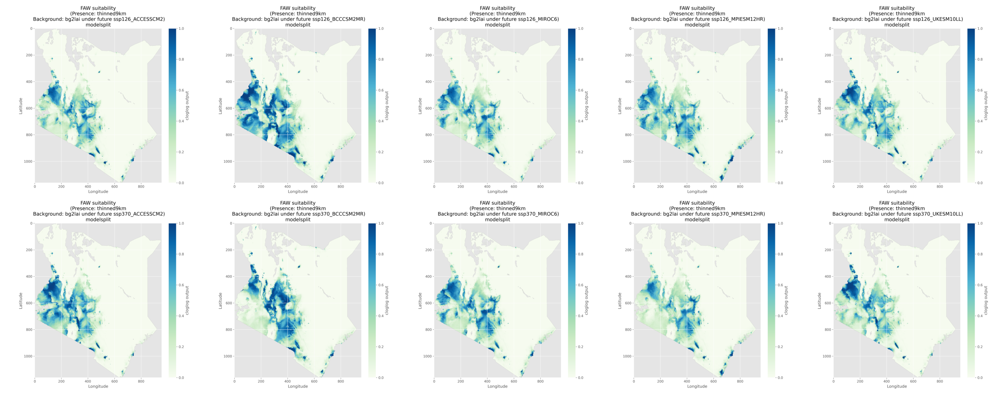

save image with modelsplit_mapNone name in "maxent_output_nov_future" folder
Found 10 .png files and 0 .tiff files with zonal_sorted in the selected subdir (if specified)':
thinned9km_bg2lai_ssp126_ACCESSCM2_future_zonal_sorted.png
thinned9km_bg2lai_ssp126_BCCCSM2MR_future_zonal_sorted.png
thinned9km_bg2lai_ssp126_MIROC6_future_zonal_sorted.png
thinned9km_bg2lai_ssp126_MPIESM12HR_future_zonal_sorted.png
thinned9km_bg2lai_ssp126_UKESM10LL_future_zonal_sorted.png
thinned9km_bg2lai_ssp370_ACCESSCM2_future_zonal_sorted.png
thinned9km_bg2lai_ssp370_BCCCSM2MR_future_zonal_sorted.png
thinned9km_bg2lai_ssp370_MIROC6_future_zonal_sorted.png
thinned9km_bg2lai_ssp370_MPIESM12HR_future_zonal_sorted.png
thinned9km_bg2lai_ssp370_UKESM10LL_future_zonal_sorted.png


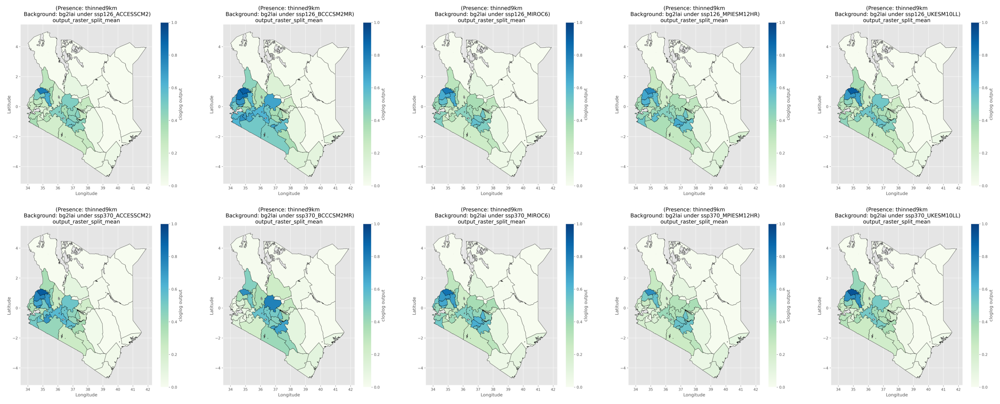

save image with zonal_sortedNone name in "maxent_output_nov_future" folder


In [ ]:


base_dir = '4_maxent_output/future'
n_cols =5
keyword = 'modelsplit_map'
ve.compare_image_output(base_dir, keyword, n_cols , saveplot = True, savefolder = '4_maxent_output/future',
                    #  subdir_select= ['ssp126'],
                     addname = None, namefile_select = None, sortlength = False,
                     labelmode= False)

base_dir = '4_maxent_output/future'
n_cols =5
keyword = 'zonal_predsplit'
ve.compare_image_output(base_dir, keyword, n_cols , saveplot = True, savefolder = '4_maxent_output/future',
                     addname = None, namefile_select = None, sortlength = False,
                     labelmode= False)

In [ ]:
# current
current = pd.read_csv('4_maxent_output/grid0.5/ModelOut_thinned9km_bg2lai_wcbioclim/thinned9km_bg2lai_wcbioclim_zonal_stats.csv')[['County', 'geometry','output_raster_split_mean']]

# auc_checker_auc_ext
base_dir = '4_maxent_output/future'
keyword = 'future_zonal_stats'
# keyword = 'era5yearmonthly'
replaced_foldername = 'thinned9km_bg2lai_'
csv_file = sorted(glob(os.path.join(base_dir, f'**/*{keyword}*.csv'), recursive=True))
len(csv_file)
# score = pd.read_csv(csv_file[1])[['County','geometry','output_raster_split_f_mean', 'output_raster_split_f_stdv', 'output_raster_split_f_25pct', 'output_raster_split_f_75pct']]
list_zonalstat = []
for path in csv_file:
  zs = pd.read_csv(path)[['County','geometry','output_raster_split_f_mean', 'output_raster_split_f_stdv', 'output_raster_split_f_25pct', 'output_raster_split_f_75pct']]
  zs['pathway_gcm'] = path.split('/')[2].replace(replaced_foldername, '').replace('_future_zonal_stats.csv','')
  print(zs['pathway_gcm'])
  split_cols = zs['pathway_gcm'].str.split('_', expand=True)
  split_cols.columns = ['pathway', 'gcm']
  zs = pd.concat([split_cols,zs], axis=1)
  # display(score)
  list_zonalstat.append(zs)

zonalstat_df = pd.concat(list_zonalstat, axis = 0)
zonalstat_df.head(3)
zonalstat_df_126 = zonalstat_df[zonalstat_df['pathway'] == 'ssp126']
zonalstat_df_370 = zonalstat_df[zonalstat_df['pathway'] == 'ssp370']

sumry_zonalstat_df_126 = zonalstat_df_126.groupby('County').describe()
sumry_zonalstat_df_126 = sumry_zonalstat_df_126['output_raster_split_f_mean'].reset_index().sort_values(by = 'mean')
sumry_zonalstat_df_126
sumry_zonalstat_df_370 = zonalstat_df_370.groupby('County').describe()
sumry_zonalstat_df_370 = sumry_zonalstat_df_370['output_raster_split_f_mean'].reset_index().sort_values(by = 'mean')

merge_ssp370126 = pd.merge(sumry_zonalstat_df_370,sumry_zonalstat_df_126, on = 'County', suffixes=('_370', '_126'))
merge_cur_fut = pd.merge(current,merge_ssp370126, on = 'County')
merge_cur_fut_sorted = merge_cur_fut.sort_values(by = 'output_raster_split_mean')

merge_cur_fut_sorted['diff_126current'] = merge_cur_fut_sorted['mean_126'] - merge_cur_fut_sorted['output_raster_split_mean']
merge_cur_fut_sorted['diff_370current'] = merge_cur_fut_sorted['mean_370'] - merge_cur_fut_sorted['output_raster_split_mean']
merge_cur_fut_sorted.to_csv('4_maxent_output/future/merge_cur_fut_sorted.csv')


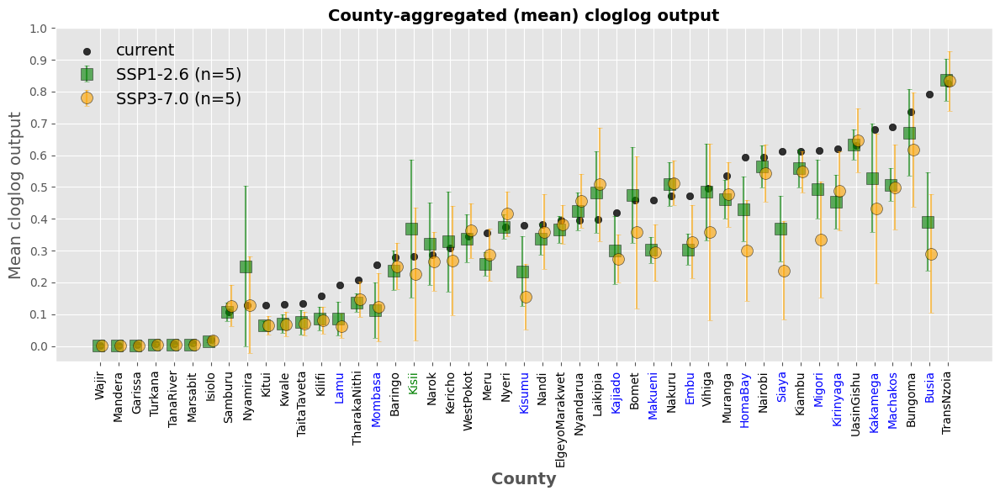

In [ ]:
#@title plot mean_cur_fut_change
fig, ax = plt.subplots(figsize=(12, 6))

# Create x-position offset so points don't overlap
x_position_current = np.arange(len(merge_cur_fut_sorted))
x_positions_126 = np.arange(len(merge_cur_fut_sorted)) - 0.1
x_positions_370 = np.arange(len(merge_cur_fut_sorted)) + 0.1

# Plot SSP126
ax.errorbar(
    x=x_positions_126,
    y=merge_cur_fut_sorted['mean_126'],
    yerr=merge_cur_fut_sorted['std_126'],
    fmt='s',
    capsize=2,
    markeredgecolor='black',
    markeredgewidth=0.5,
    markersize=10,
    color='green',
    label='SSP1-2.6 (n=5)',
    alpha=0.6
)

# Plot SSP370
ax.errorbar(
    x=x_positions_370,
    y=merge_cur_fut_sorted['mean_370'],
    yerr=merge_cur_fut_sorted['std_370'],
    fmt='o',
    capsize=2,
    markeredgecolor='black',
    markeredgewidth=0.5,
    markersize=10,
    color='orange',
    label='SSP3-7.0 (n=5)',
    alpha=0.6
)
ax.scatter(
    x=x_position_current,
    y=merge_cur_fut_sorted['output_raster_split_mean'],
    color='black',
    # markeredgewidth=0.3,
    label='current',
    alpha=0.8)
# Set x-axis labels
ax.set_xticks(range(len(merge_cur_fut_sorted)))
ax.set_xticklabels(merge_cur_fut_sorted['County'], rotation=90, fontsize=10)
ax.set_ylim(-0.05, 1)
ax.set_yticks(np.arange(0, 1.1, 0.1))
ax.set_ylabel('Mean cloglog output', fontsize=14)
ax.set_xlabel('County', fontsize=14, fontweight='bold')
ax.set_title('County-aggregated (mean) cloglog output', fontsize=14, fontweight='bold')
ax.legend(fontsize=14, frameon=False)
ax.grid(True, alpha=1, linestyle='-')

for label, diff126, diff370 in zip(ax.get_xticklabels(), merge_cur_fut_sorted['diff_126current'], merge_cur_fut_sorted['diff_370current']):
    if diff126 > 0 and diff370 > 0 and (abs(diff126) > 0.1 and abs(diff370)> 0.1):
        label.set_color('red')      # positive both (more risk)
    elif diff126 < 0 and diff370 <0 and (abs(diff126) > 0.1 and abs(diff370)> 0.1):
        label.set_color('blue')     # negative both (less risk)
    elif diff126 > 0 and diff370 <= 0 and (abs(diff126) > 0.05):
        label.set_color('green')    # more risk in  diff126, less risk in diff370
    elif diff126 <= 0 and diff370 > 0 and (abs(diff370) > 0.05):
        label.set_color('orange')   # less risk in  diff126, more risk in diff370
    else:
        label.set_color('black')    # zero

plt.tight_layout()
plt.show()


/tmp/ipython-input-813854437.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes.set_xticklabels(axes.get_xticklabels(), rotation=90)


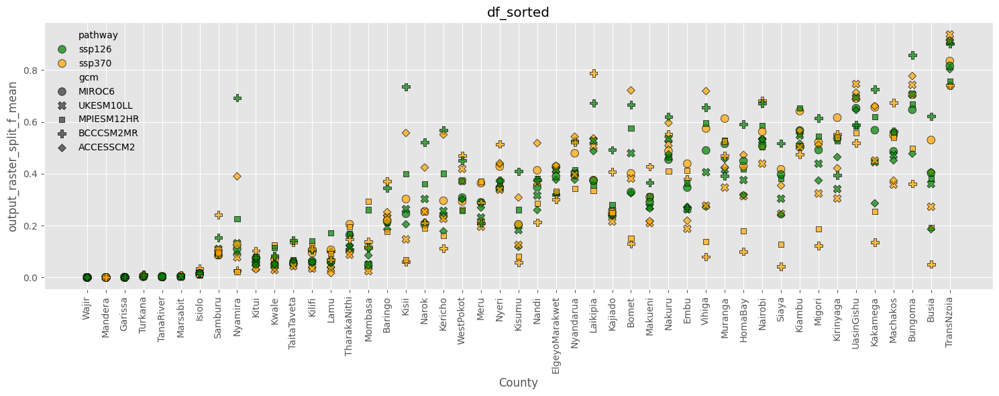

In [ ]:
import seaborn as sns

df = pd.merge(current,zonalstat_df, on = 'County')
df_sorted = df.sort_values(by = 'output_raster_split_mean')

fig, axes = plt.subplots(1, 1, figsize=(15, 6))
pathway_order = ['ssp126', 'ssp370']
marker_seq = ['s', 'P']
marker_map = dict(zip(pathway_order, marker_seq))
col_map = {'ssp126': 'green', 'ssp370': 'orange'}
sns.scatterplot(ax=axes,
    data=df_sorted,
    x="County",
    y="output_raster_split_f_mean",
    hue="pathway",
    style =  'gcm',
    palette = col_map,

    # hue="gcm",          # color by gcm
    # style="pathway",     # marker shape by background
    s=70,                   # marker size
    alpha=0.7,
    edgecolor="black"
    # markers = marker_map,
    # style_order=pathway_order
)
axes.legend_.get_frame().set_visible(False)
axes.set_xticklabels(axes.get_xticklabels(), rotation=90)
plt.title('df_sorted')
plt.tight_layout()
fig.show()
